<a href="https://colab.research.google.com/github/harisapn/dog-vision/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#!unzip "drive/MyDrive/dogVision/dog-breed-identification.zip" -d "drive/MyDrive/dogVision/"

get the data from kaggle

In [ ]:
! pip install kaggle

In [ ]:
! mkdir ~/.kaggle

In [ ]:
! cp kaggle.json ~/.kaggle/

In [ ]:
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
! kaggle datasets download dog-breed-identification/data

403 - Forbidden - Permission 'datasets.get' was denied


## Get our workspace ready

*Import tensorflow

*Import tensorflow Hub

*Make sure we are using GPU





In [9]:
#import tensorflow

import tensorflow as tf
print("TF_version:",tf.__version__)

TF_version: 2.12.0


In [ ]:
import tensorflow_hub as hub
print("TF hub version:",hub.__version__)

#Check for GPU availability
print("GPU","available(Yeeees)" if tf.config.list_physical_devices("GPU") else "not available:(")


TF hub version: 0.14.0
GPU available(Yeeees)


## getting our data ready (turning it into tensorflow -numerical representation)

In [ ]:
#check out the labels of our data
import pandas as pd

labels=pd.read_csv("/content/drive/MyDrive/dogVision/labels.csv")
print(labels.describe())
print(labels.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

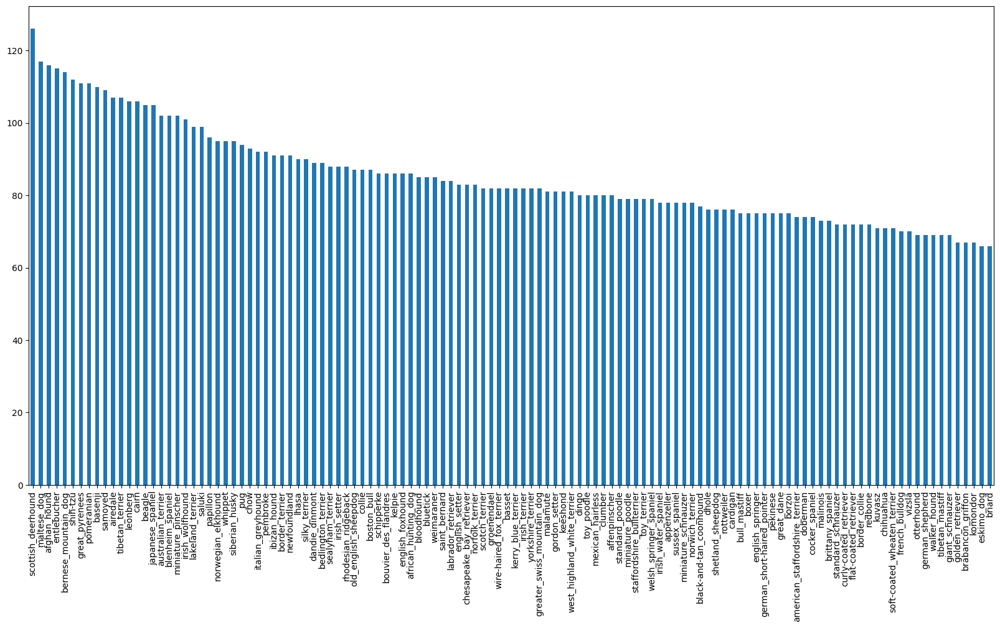

In [ ]:
# How many images are there of each class
labels["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels["breed"].value_counts().median()

82.0

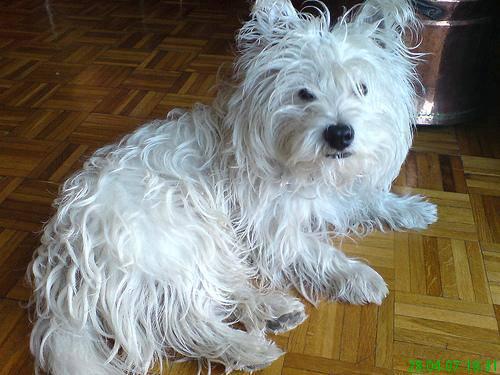

In [ ]:
from IPython.display import Image
Image("drive/MyDrive/dogVision/train/1dd650ee2df0ec8bd9bc8c38f94b2bcf.jpg")

In [10]:
### Getting images and labels

filenames=["drive/MyDrive/dogVision/train/" + fname +".jpg" for fname in labels["id"]]


filenames

['drive/MyDrive/dogVision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/dogVision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/dogVision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/dogVision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/dogVision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/dogVision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/dogVision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/dogVision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/dogVision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/dogVision/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 'drive/MyDrive/dogVision/train/004396df1acd0f1247b740ca2b14616e.jpg',
 'drive/MyDrive/dogVision/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
 'drive/MyDrive/dogVision/train/00693b8bc2470375cc744a6391d397ec.jpg',
 'drive/MyDrive/dogVision/train/006cc3ddb9dc1bd827479569fcdc52dc.jpg',
 'driv

In [11]:
import os

len(os.listdir("drive/MyDrive/dogVision/train/"))
#len(filenames)
a=os.listdir("drive/MyDrive/dogVision/train/")
len(a)


10222

In [ ]:
matches = []

for match in a:
    if "(1)" in match:
        matches.append(match)

print(matches)


[]


In [12]:
#Check whethrt the number of files matches actual number of image files

if len(os.listdir("drive/MyDrive/dogVision/train/"))==len(filenames):
  print("Number of files same")
else:
  print("Number of files not same")

#nisu sve slike u train uploadovane

Number of files same


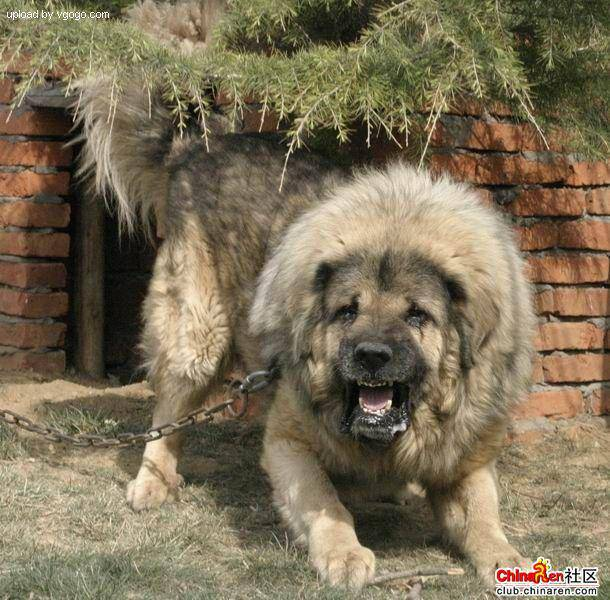

In [13]:
#One more check

Image(filenames[9000])

In [14]:
labels["breed"][9000]

'tibetan_mastiff'

Preparing labels

In [15]:
import numpy as np
labels=labels["breed"].to_numpy()
#labels=np.array(labels)
labels
len(labels)


10222

In [16]:
if len(labels)==len(filenames):
 print("number of labels matches number of filenames")
else:
  print("doesnt match")

number of labels matches number of filenames


Find the unique label values

In [17]:
unique_breeds=np.unique(labels)
print(unique_breeds)
len(unique_breeds)

['affenpinscher' 'afghan_hound' 'african_hunting_dog' 'airedale'
 'american_staffordshire_terrier' 'appenzeller' 'australian_terrier'
 'basenji' 'basset' 'beagle' 'bedlington_terrier' 'bernese_mountain_dog'
 'black-and-tan_coonhound' 'blenheim_spaniel' 'bloodhound' 'bluetick'
 'border_collie' 'border_terrier' 'borzoi' 'boston_bull'
 'bouvier_des_flandres' 'boxer' 'brabancon_griffon' 'briard'
 'brittany_spaniel' 'bull_mastiff' 'cairn' 'cardigan'
 'chesapeake_bay_retriever' 'chihuahua' 'chow' 'clumber' 'cocker_spaniel'
 'collie' 'curly-coated_retriever' 'dandie_dinmont' 'dhole' 'dingo'
 'doberman' 'english_foxhound' 'english_setter' 'english_springer'
 'entlebucher' 'eskimo_dog' 'flat-coated_retriever' 'french_bulldog'
 'german_shepherd' 'german_short-haired_pointer' 'giant_schnauzer'
 'golden_retriever' 'gordon_setter' 'great_dane' 'great_pyrenees'
 'greater_swiss_mountain_dog' 'groenendael' 'ibizan_hound' 'irish_setter'
 'irish_terrier' 'irish_water_spaniel' 'irish_wolfhound'
 'italian

120

In [18]:
#turn a single label into an array of boolean
labels[0]==unique_breeds # where it is equal

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [20]:
for label in labels:
  print(label)

Streaming output truncated to the last 5000 lines.
kelpie
american_staffordshire_terrier
brittany_spaniel
scottish_deerhound
lakeland_terrier
groenendael
australian_terrier
affenpinscher
pug
sussex_spaniel
dandie_dinmont
west_highland_white_terrier
leonberg
pomeranian
groenendael
irish_wolfhound
saint_bernard
shih-tzu
newfoundland
leonberg
chesapeake_bay_retriever
beagle
norfolk_terrier
kelpie
bouvier_des_flandres
rottweiler
samoyed
wire-haired_fox_terrier
tibetan_mastiff
borzoi
bernese_mountain_dog
basset
lhasa
scottish_deerhound
weimaraner
lakeland_terrier
saluki
norwegian_elkhound
wire-haired_fox_terrier
english_setter
miniature_poodle
clumber
maltese_dog
saluki
miniature_schnauzer
kuvasz
kelpie
old_english_sheepdog
appenzeller
west_highland_white_terrier
otterhound
groenendael
tibetan_terrier
airedale
toy_poodle
vizsla
irish_terrier
groenendael
staffordshire_bullterrier
afghan_hound
rottweiler
shih-tzu
bouvier_des_flandres
tibetan_terrier
cocker_spaniel
newfoundland
gordon_setter
w

In [26]:
#turn every label into boolean array
boolean_label=[unique_breeds==label for label in labels]
boolean_label
len(boolean_label)
boolean_label

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [29]:
unique_breeds==labels[0]


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [21]:
#Turning boolean array into integers
print(labels[0])
print(np.where(unique_breeds==labels[0])) # print where labels[0] occurs in unique_breeds
print(boolean_label[0].argmax()) #index where label occurs in boolean array
print(boolean_label[0].astype(int)) #there will be one where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [30]:
print(labels[2])
print(boolean_label[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


Creating Validation Set


In [31]:
#Setup X and y
X=filenames
y=boolean_label

In [32]:
#Num of images to use for experimentig
NUM_IMAGES=1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [33]:
#Lets split our datainto train and validation
from sklearn.model_selection import train_test_split

#split them into train and valdation of total size NUM_IMAGEs
X_train,X_val,y_train,y_val=train_test_split(X[:NUM_IMAGES],
                                             y[:NUM_IMAGES],
                                             test_size=0.2,
                                             random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)


(800, 800, 200, 200)

In [34]:
#lets have a geez at the training data
X_train[:5],y_train[:5]

(['drive/MyDrive/dogVision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/dogVision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/dogVision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/dogVision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/dogVision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False

##Preprocessing images, turning images into tensors

Write a function that does a few things
1. Take an image file path as input
2. Use tensorflow to read image and save it as variable
3. Turn our ;image; into tensors
4. Resize image into standardize size (224,224)
5. Return the modified image

In [35]:
#Convert an image into Numpy array
from matplotlib.pyplot import imread
image=imread(filenames[42])
image.shape
image # image is the array of numbers between 255 and 0, combination of RGB
image.max()

255

In [36]:
#turn image into a tensor
tf.constant(image[:2])


<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [37]:
#DEfine image size
IMG_SIZE=224

#Create a function for image preprocess

def proces_image(image_path,img_size=IMG_SIZE):
  #read an image file

  image=tf.io.read_file(image_path)
  #turn the jpeg image into numerical tensor with 3 color chanels RGB

  image=tf.image.decode_jpeg(image,channels=3)

  # normalize values from 0-255 to 0-1
  image=tf.image.convert_image_dtype(image, tf.float32)

  #resize image to our desired values

  image=tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])

  return image


Batches - using 32 images at the time.
in order to use TensorFlow effectively we need to have Tensor tuples '(image, label)'



In [38]:
#turning data into batches
#create a fuction to return tuple

def get_image_label(image_path,label):

  image=proces_image(image_path)

  return image, label


In [39]:
#Demo of the above

(proces_image(X[42]),y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Turn our data into tuples of Tensors in the form (image,label), lets make a function to turn our data (x, y) into batches

In [40]:
#Define the batch size
BATCH_SIZE=32

#create function to turn data into batches

def create_data_batches(X,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):

  """
Creates batches of data out of image (X) and (y) pairs
Shuffles the data if it is training data, but doesnt shuffle if validation data
Also accepts test data as input (no labels)
  """

  # if the data is test data, no labels
  if test_data:
    print("Creating test data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X))) #only filepaths no labels ---TURNS X into DATASET
    data_batch=data.map(proces_image).batch(BATCH_SIZE)
    return data_batch

  elif valid_data:
    print("Creating validation data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X), #filepaths
                                            tf.constant(y))) #labels

    data=data.map(get_image_label) # image label
    data_batch=data.batch(BATCH_SIZE)

    return data_batch

  else:
    print("Creating training data_batches.....")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                             tf.constant(y)))

    #Shuffling the pathnames and labels before mapping image procesor function is faster than shuffling images
    data=data.shuffle(buffer_size=len(X))

    #create image label tupples, turns the image part into preproces image
    data=data.map(get_image_label)


    #turn the trainign data into batches

    data_batch=data.batch(BATCH_SIZE)

  return data_batch

In [41]:
#Create training and validation data batches
train_data=create_data_batches(X_train,y_train)
val_data=create_data_batches(X_val,y_val,valid_data=True)


Creating training data_batches.....
Creating validation data batches...


In [42]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing data batches


In [43]:
import matplotlib.pyplot as plt

#Create a function for visualizing images in data batches

def show_25_images(images,labels):
  """
  Display a plot of 25 images and their labels from a data batch

"""

#Setup the figure

  plt.figure(figsize=(10,10))

  #Loop through 25 images
  for i in range(25):
    #create a subplots
    ax=plt.subplot(5,5,i+1)

    #Display an image
    plt.imshow(images[i])

    #Add the image label as a title
    plt.title(unique_breeds[labels[i].argmax()])
    #turn the grid line on
    #plt.axis("off")



In [44]:
train_images, train_labels=next(train_data.as_numpy_iterator())
train_images, train_labels


(array([[[[0.10980393, 0.10196079, 0.04313726],
          [0.10980393, 0.10196079, 0.04313726],
          [0.10980393, 0.10196079, 0.04993998],
          ...,
          [0.20840336, 0.16134453, 0.10644257],
          [0.2128051 , 0.16574627, 0.11084431],
          [0.21696676, 0.16990793, 0.11500596]],
 
         [[0.10588236, 0.10196079, 0.02521009],
          [0.10588236, 0.10196079, 0.02521009],
          [0.10588236, 0.10196079, 0.02521009],
          ...,
          [0.20768307, 0.16062424, 0.10572228],
          [0.2216086 , 0.17454976, 0.11964781],
          [0.23221286, 0.18515402, 0.13025206]],
 
         [[0.10196079, 0.09803922, 0.01568628],
          [0.10196079, 0.09803922, 0.01568628],
          [0.10196079, 0.09803922, 0.01960784],
          ...,
          [0.21840738, 0.17134854, 0.11644658],
          [0.22072828, 0.17366944, 0.11876748],
          [0.22492999, 0.17787115, 0.1229692 ]],
 
         ...,
 
         [[0.4484192 , 0.13469368, 0.18567407],
          [0.46038

In [45]:
len(train_images), len(train_labels)

(32, 32)

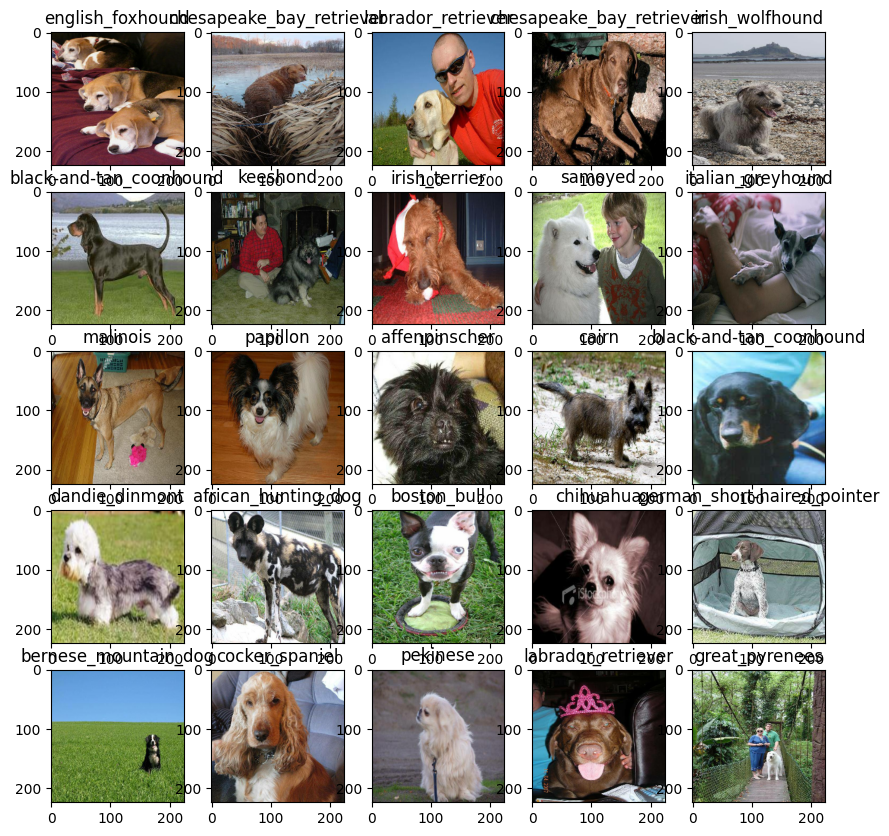

In [46]:
#Lets visualize data in training batch
show_25_images(train_images, train_labels)

In [47]:
y[0].argmax()

19

In [48]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

Function which:

Takes the input shape, output shape and the model we've chosen as parameters.
Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
Compiles the model (says it should be evaluated and improved).
Builds the model (tells the model the input shape it'll be getting).
Returns the model.

In [49]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [50]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


In [51]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [52]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/My Drive/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [53]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

In [54]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [55]:
# Check to make sure we're still running on a GPU
print("GPU", "available (YESSS!!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESSS!!!!!!)


In [56]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model

In [57]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 245s 9s/step - loss: 4.4899 - accuracy: 0.1200 - val_loss: 3.4587 - val_accuracy: 0.2700
Epoch 2/100
25/25 [==============================] - 3s 126ms/step - loss: 1.5960 - accuracy: 0.6812 - val_loss: 2.2143 - val_accuracy: 0.4950
Epoch 3/100
25/25 [==============================] - 4s 177ms/step - loss: 0.5550 - accuracy: 0.9375 - val_loss: 1.7736 - val_accuracy: 0.5750
Epoch 4/100
25/25 [==============================] - 3s 121ms/step - loss: 0.2464 - accuracy: 0.9900 - val_loss: 1.5755 - val_accuracy: 0.6250
Epoch 5/100
25/25 [==============================] - 3s 123ms/step - loss: 0.1472 - accuracy: 0.9950 - val_loss: 1.4923 - val_accuracy: 0.6500
Epoch 6/100
25/25 [==============================] - 3s 117ms/step - loss: 0.0997 - accuracy: 1.0000 - val_loss: 1.4453 - val_accuracy: 0.6500
Epoch 7/100
25/25 [==============================]

In [58]:
#checking the tensorboard logs
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

### Making and evaluating predictions using a trained model

In [59]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 59s 89ms/step


array([[1.3793650e-03, 8.1157734e-05, 1.0465577e-04, ..., 8.5540285e-04,
        1.2644264e-05, 6.6358806e-03],
       [6.1653811e-04, 1.0307735e-03, 3.9719380e-03, ..., 6.0012750e-04,
        6.1812773e-03, 1.2134885e-04],
       [3.1913905e-06, 4.8602767e-05, 1.1360154e-05, ..., 1.4163251e-04,
        1.0006607e-05, 1.2280510e-04],
       ...,
       [5.9719296e-06, 5.9101138e-05, 2.4007149e-06, ..., 1.0510291e-05,
        1.3045021e-04, 2.0230733e-05],
       [9.2349518e-03, 4.2428970e-04, 2.6871823e-04, ..., 4.5902390e-04,
        6.7327746e-05, 2.0526152e-02],
       [3.8123559e-04, 1.8252873e-04, 5.2062282e-04, ..., 1.6134826e-03,
        3.0567712e-04, 1.4060590e-04]], dtype=float32)

In [60]:
predictions[0]

array([1.37936499e-03, 8.11577338e-05, 1.04655774e-04, 1.89292536e-04,
       1.07311040e-04, 3.60603663e-05, 2.70936582e-02, 1.10288864e-04,
       5.28357850e-05, 1.94730761e-03, 2.93712917e-04, 2.64426926e-04,
       1.34418879e-04, 2.60942215e-05, 8.81997039e-05, 1.64486555e-04,
       5.32022386e-06, 1.73127770e-01, 2.23353691e-05, 3.41697705e-05,
       6.71737420e-04, 7.51003754e-05, 8.79975141e-06, 1.27074518e-03,
       1.81690739e-05, 6.55309559e-05, 4.77116764e-01, 1.27390173e-04,
       5.02302952e-04, 2.48846802e-04, 1.14909984e-04, 9.69232759e-04,
       5.47685660e-04, 4.19241769e-05, 3.02665630e-05, 6.29405398e-03,
       2.61935766e-05, 1.12858100e-03, 9.24739361e-05, 2.64182192e-04,
       6.45917025e-04, 2.76109749e-05, 5.03031079e-05, 1.74399502e-05,
       6.61498416e-06, 3.02124477e-04, 2.01910661e-05, 1.01270081e-04,
       3.79313657e-04, 7.95391315e-05, 3.31366755e-05, 1.56868482e-05,
       8.93969671e-04, 1.90086957e-05, 7.03496553e-05, 7.79501806e-06,
      

In [61]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[2.79352913e-04 2.88251438e-04 1.40368038e-05 3.68610286e-04
 2.96520488e-03 6.57319397e-05 4.33948153e-04 4.58481815e-03
 1.26760891e-02 4.85376604e-02 1.22715166e-04 4.77472749e-05
 8.44164984e-04 3.84366559e-03 1.04808854e-03 4.52552177e-03
 4.15167742e-04 1.66920305e-03 1.79793104e-04 1.20969268e-03
 5.26304102e-05 1.21986249e-03 1.68961211e-04 1.18072217e-04
 7.47061521e-03 2.51969352e-04 2.83967413e-04 6.86158310e-04
 3.56063189e-04 1.76824469e-04 2.56368530e-05 1.66369471e-04
 1.84295815e-04 4.91360624e-05 1.34675311e-05 6.60126243e-05
 2.86817696e-04 2.44473136e-04 8.18185435e-05 1.99696809e-01
 1.55190573e-04 8.66905684e-05 2.14440953e-02 4.99548696e-06
 1.42951074e-04 6.12914664e-05 3.65460175e-04 1.25550479e-03
 4.24284844e-05 8.68854870e-04 3.67464309e-05 1.77288981e-04
 1.61601359e-03 5.99649083e-03 1.35102207e-04 5.31413709e-04
 1.57451024e-04 2.35569081e-04 1.54012538e-04 1.58698327e-04
 7.37361552e-05 2.60001165e-03 9.55424071e-07 8.16029133e-05
 1.74602799e-04 8.756134

In [62]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'golden_retriever'

In [63]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [64]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and reutrns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get get:

Prediction labels
Validation labels (truth labels)
Validation images
Let's make some function to make these all a bit more visaulize.

We'll create a function which:

Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer. ✅
Convert the prediction probabilities to a predicted label. ✅
Plot the predicted label, its predicted probability, the truth label and the target image on a single plot. ✅

In [66]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

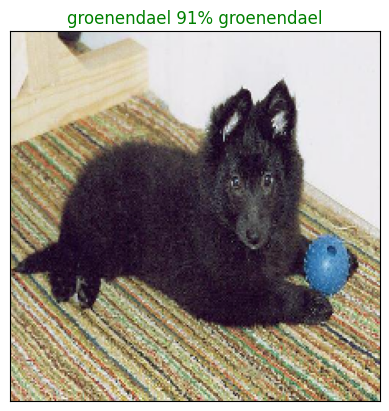

In [67]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions.

This function will:

Take an input of prediction probabilities array and a ground truth array and an integer ✅
Find the prediction using get_pred_label() ✅
Find the top 10:
Prediction probabilities indexes ✅
Prediction probabilities values ✅
Prediction labels ✅
Plot the top 10 prediction probability values and labels, coloring the true label green ✅

In [68]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

In [69]:
unique_breeds[predictions[0].argsort()[::-10][::-1]]

array(['great_dane', 'dhole', 'collie', 'golden_retriever', 'basenji',
       'airedale', 'bedlington_terrier', 'norwegian_elkhound',
       'english_setter', 'beagle', 'dandie_dinmont', 'cairn'],
      dtype=object)

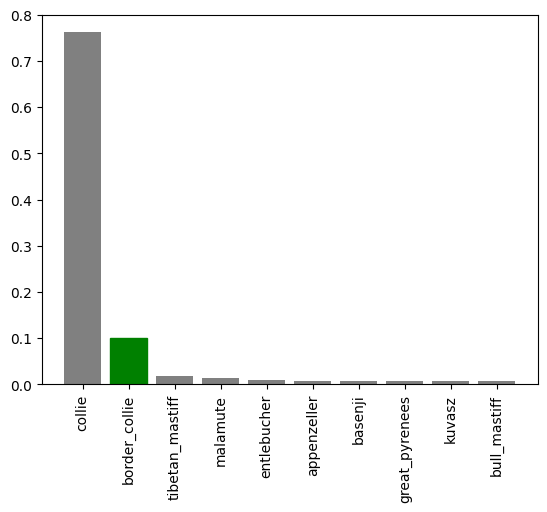

In [70]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

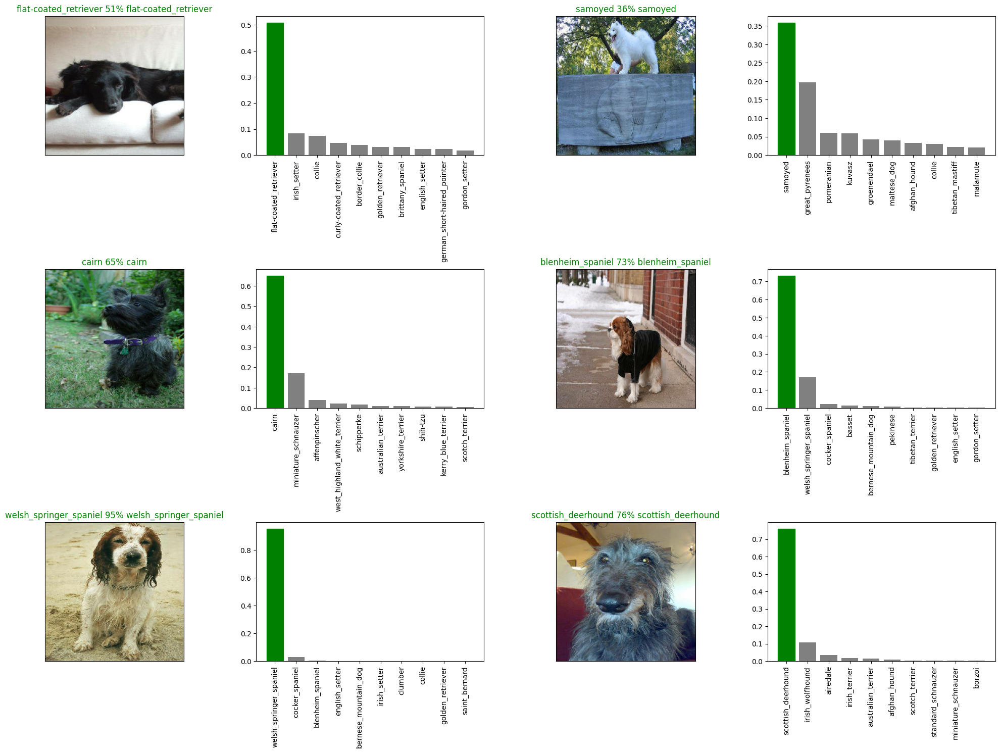

In [71]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [72]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/My Drive/dogVision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [73]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [74]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/My Drive/dogVision/models/20230817-12511692276701-1000-images-mobilenetv2-Adam.h5...


'drive/My Drive/dogVision/models/20230817-12511692276701-1000-images-mobilenetv2-Adam.h5'

In [75]:
# Load a trained model
loaded_1000_image_model = load_model("drive/My Drive/dogVision/models/20230807-10301691404223-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: drive/My Drive/dogVision/models/20230807-10301691404223-1000-images-mobilenetv2-Adam.h5


In [76]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 134ms/step - loss: 1.3640 - accuracy: 0.6650


[1.3640336990356445, 0.6650000214576721]

In [77]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 79ms/step - loss: 1.4671 - accuracy: 0.6550


[1.4671403169631958, 0.6549999713897705]

###Training a big dog model (on the full data)

In [81]:

len(X), len(y)

(10222, 10222)

800

In [82]:
#Create a batch from full data
full_data=create_data_batches(X,y)

Creating training data_batches.....


In [83]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [84]:
#Create a model for a fullmodel
full_model=create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [85]:
#create a full model callbacks
full_model_tensorboard=create_tensorboard_callback()
#No validation set when training on the full data,so we cannot monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [86]:
#fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 1929s 6s/step - loss: 1.3613 - accuracy: 0.6627
Epoch 2/100
320/320 [==============================] - 35s 108ms/step - loss: 0.4086 - accuracy: 0.8777
Epoch 3/100
320/320 [==============================] - 33s 104ms/step - loss: 0.2382 - accuracy: 0.9344
Epoch 4/100
320/320 [==============================] - 35s 109ms/step - loss: 0.1557 - accuracy: 0.9629
Epoch 5/100
320/320 [==============================] - 34s 107ms/step - loss: 0.1074 - accuracy: 0.9773
Epoch 6/100
320/320 [==============================] - 34s 107ms/step - loss: 0.0773 - accuracy: 0.9865
Epoch 7/100
320/320 [==============================] - 34s 106ms/step - loss: 0.0585 - accuracy: 0.9905
Epoch 8/100
320/320 [==============================] - 35s 110ms/step - loss: 0.0481 - accuracy: 0.9936
Epoch 9/100
320/320 [==============================] - 33s 104ms/step - loss: 0.0396 - accuracy: 0.9952
Epoch 10/100
320/320 [==============================] - 34s 106ms

In [87]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/My Drive/dogVision/models/20230817-13511692280308-full-image-set-mobilenetv2-Adam.h5...


'drive/My Drive/dogVision/models/20230817-13511692280308-full-image-set-mobilenetv2-Adam.h5'

In [88]:
# Load in the full model
loaded_full_model = load_model('drive/My Drive/dogVision/models/20230809-09231691573026-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: drive/My Drive/dogVision/models/20230809-09231691573026-full-image-set-mobilenetv2-Adam.h5


###Making predictions on the test dataset
Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created create_data_batches() earlier which can take a list of filenames as input and conver them into Tensor batches.

To make predictions on the test data, we'll:

Get the test image filenames. ✅
Convert the filenames into test data batches using create_data_batches() and setting the test_data parameter to True (since the test data doesn't have labels). ✅
Make a predictions array by passing the test batches to the predict() method called on our model.

In [89]:
# Load test image filenames
test_path = "drive/MyDrive/dogVision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/dogVision/test/e7b357150635c250757363718e4dae86.jpg',
 'drive/MyDrive/dogVision/test/e774fbfeb4b712ca042f93edea3835af.jpg',
 'drive/MyDrive/dogVision/test/e732916519751eaa0cb2ba0cc1217ab9.jpg',
 'drive/MyDrive/dogVision/test/e83fec66a32873298df9fa5fdac113aa.jpg',
 'drive/MyDrive/dogVision/test/e8505566fd9116b812e306ca196b62da.jpg',
 'drive/MyDrive/dogVision/test/e7feb64da6aae1ef8e62453f6660d0c5.jpg',
 'drive/MyDrive/dogVision/test/e83f4c0ff6dec86d89d0f8b70ecd3cea.jpg',
 'drive/MyDrive/dogVision/test/e83d7fa8fdfba0ec577f9c8df811d439.jpg',
 'drive/MyDrive/dogVision/test/e823ee1ca007c88600806925a6f2bce1.jpg',
 'drive/MyDrive/dogVision/test/e7fcdf9671a6593b638cbee42842f981.jpg']

In [90]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [91]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

: Calling predict() on our full model and passing it the test data batch will take a long time to run (about a ~1hr). This is because we have to process ~10,000+ images and get our model to find patterns in those images and generate predictions based on what its learned in the training dataset.

In [92]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 185s 547ms/step


In [93]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("drive/MyDrive/dogVision/preds_array.csv", test_predictions, delimiter=",")

In [94]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/dogVision/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[:10]

array([[1.87465719e-06, 7.06070966e-11, 6.31176222e-10, ...,
        5.22074650e-08, 1.48153250e-08, 1.30912176e-05],
       [9.53303392e-09, 4.62706706e-10, 1.00942388e-11, ...,
        4.73159162e-07, 4.39350106e-06, 1.19264176e-09],
       [2.95501227e-13, 3.51134676e-13, 1.77662344e-15, ...,
        2.92466839e-15, 5.03937441e-13, 1.26782994e-11],
       ...,
       [1.31248110e-10, 1.42913658e-11, 1.28705727e-12, ...,
        1.05388929e-12, 1.19096464e-12, 2.27062050e-10],
       [7.64223529e-09, 1.18281434e-06, 7.82843290e-10, ...,
        1.07625254e-07, 4.04706374e-02, 1.49504402e-07],
       [1.20699376e-16, 2.32912891e-13, 8.60972621e-16, ...,
        4.50364329e-11, 2.37751781e-14, 2.19845102e-17]])

In [95]:
test_predictions.shape

(10357, 120)

In [96]:
len(test_filenames)

10357

In [97]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


###Preparing test dataset predictions for Kaggle
Looking at the Kaggle sample submission, we find that it wants our models prediction probaiblity outputs in a DataFrame with an ID and a column for each different dog breed. https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:

Create a pandas DataFrame with an ID column as well as a column for each dog breed. ✅
Add data to the ID column by extracting the test image ID's from their filepaths.
Add data (the prediction probabilites) to each of the dog breed columns.
Export the DataFrame as a CSV to submit it to Kaggle.

In [ ]:
# ["id"] + list(unique_breeds)

In [98]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [99]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [100]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e7b357150635c250757363718e4dae86,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e774fbfeb4b712ca042f93edea3835af,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e732916519751eaa0cb2ba0cc1217ab9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e83fec66a32873298df9fa5fdac113aa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e8505566fd9116b812e306ca196b62da,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [101]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e7b357150635c250757363718e4dae86,1.874657e-06,7.060710e-11,6.311762e-10,4.143159e-06,5.306516e-07,2.172074e-10,7.213455e-05,2.571664e-07,6.971410e-08,...,2.103763e-05,8.536612e-03,1.032068e-07,1.030129e-07,1.532127e-09,9.452411e-07,8.994846e-04,5.220747e-08,1.481532e-08,1.309122e-05
1,e774fbfeb4b712ca042f93edea3835af,9.533034e-09,4.627067e-10,1.009424e-11,4.837092e-05,1.704702e-09,8.560528e-09,9.313397e-08,6.011305e-10,9.222123e-10,...,7.508652e-10,8.296120e-09,1.069542e-06,1.103558e-10,2.865321e-11,7.455042e-09,1.459761e-10,4.731592e-07,4.393501e-06,1.192642e-09
2,e732916519751eaa0cb2ba0cc1217ab9,2.955012e-13,3.511347e-13,1.776623e-15,9.058430e-14,1.481123e-12,3.407661e-12,1.039797e-12,4.593648e-13,2.995615e-10,...,3.084737e-12,5.733736e-17,1.237345e-13,7.936881e-14,1.263926e-14,3.300819e-10,1.170778e-13,2.924668e-15,5.039374e-13,1.267830e-11
3,e83fec66a32873298df9fa5fdac113aa,1.595166e-08,1.282627e-09,7.913876e-10,3.478610e-13,3.451113e-12,3.147431e-09,2.075607e-11,3.694271e-12,1.726002e-13,...,5.145695e-12,5.876739e-11,1.795281e-11,1.215759e-10,1.147059e-08,8.417541e-15,3.494207e-11,7.059027e-08,1.734287e-07,5.695195e-10
4,e8505566fd9116b812e306ca196b62da,6.423049e-13,1.007593e-11,5.806622e-11,2.217992e-11,9.413053e-01,1.207743e-04,7.179908e-06,2.891519e-02,1.013605e-08,...,1.801982e-09,5.042650e-07,1.259769e-08,1.316337e-04,1.160657e-09,5.471265e-09,4.464256e-13,3.513646e-05,4.786244e-08,8.596211e-11


In [102]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/MyDrive/dogVision/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

###Making predictions on custom images
To make predictions on custom images, we'll:

Get the filepaths of our own images.
Turn the filepaths into data batches using create_data_batches(). And since our custom images won't have labels, we set the test_data parameter to True.
Pass the custom image data batch to our model's predict() method.
Convert the prediction output probabilities to predictions labels.
Compare the predicted labels to the custom images.

In [112]:
# Get custom image filepaths
custom_path = "drive/MyDrive/dogVision/slikee/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [113]:
custom_image_paths

['drive/MyDrive/dogVision/slikee/doggie-matchmaker-is-the-labrador-retriever-right-for-you.jpg',
 'drive/MyDrive/dogVision/slikee/golden-retriever-177213599-2000-a30830f4d2b24635a5d01b3c5c64b9ef.jpg',
 'drive/MyDrive/dogVision/slikee/lakeland_terrier_hero.jpg']

In [114]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [115]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 2s 2s/step


In [116]:
custom_preds.shape

(3, 120)

In [117]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['golden_retriever', 'golden_retriever', 'lakeland_terrier']

In [119]:
# Get custom images (our unbatchify() function won't work since there aren't labels... maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

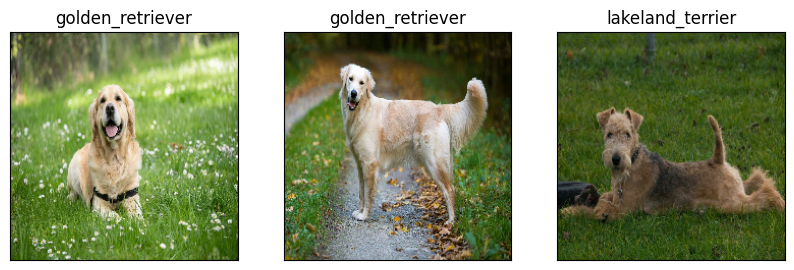

In [120]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)